In [1]:
import wave

In [17]:
from scipy.io import wavfile

In [2]:
obj = wave.open('0556.wav','r')
print( "Number of channels",obj.getnchannels())
print ( "Sample width",obj.getsampwidth())
print ( "Frame rate.",obj.getframerate())
print ("Number of frames",obj.getnframes())
print ( "parameters:",obj.getparams())
obj.close()

Number of channels 2
Sample width 2
Frame rate. 48000
Number of frames 3384589
parameters: _wave_params(nchannels=2, sampwidth=2, framerate=48000, nframes=3384589, comptype='NONE', compname='not compressed')


In [7]:
params = obj.getparams()

In [10]:
print(params[3])

3384589


In [15]:
frames = obj.readframes(3384589)
print(frames)

ValueError: read of closed file

In [16]:
from scipy.io import wavfile
samplerate, data = wavfile.read('0556.wav')

C:\Users\Pete\anaconda3\envs\gmaps\lib\site-packages\ipykernel_launcher.py:2: WavFileWarning: Chunk (non-data) not understood, skipping it.
  


In [34]:
data.dtype

dtype('int16')

In [41]:
print(data[1])
print(samplerate)

[-41 197]
48000


C:\Users\Pete\anaconda3\envs\gmaps\lib\site-packages\IPython\core\pylabtools.py:132: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


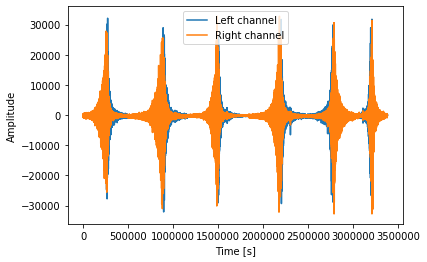

In [35]:
import matplotlib.pyplot as plt
import numpy as np
time = np.linspace(0., length, data.shape[0])
plt.plot(time, data[:, 0], label="Left channel")
plt.plot(time, data[:, 1], label="Right channel")
plt.legend()
plt.xlabel("Time [s]")
plt.ylabel("Amplitude")
plt.show()

In [107]:
left_channel = data[:,0]
right_channel = data[:,1]
print (left_channel)
print (right_channel)

[-69 -41 -55 ...   0   0   0]
[211 197 183 ...   0   0   0]


In [108]:
left_channel_update = left_channel+150
right_channel_update = right_channel
print(left_channel_update)
print(right_channel_update)

[ 81 109  95 ... 150 150 150]
[211 197 183 ...   0   0   0]


In [109]:
new_data = []
new_data = (np.vstack((left_channel_update, right_channel_update)).T)
print(new_data)

[[ 81 211]
 [109 197]
 [ 95 183]
 ...
 [150   0]
 [150   0]
 [150   0]]


In [110]:
new_data.dtype


dtype('int16')

In [95]:
new_data_2 = new_data.astype(int)
new_data_2.dtype

dtype('int32')

In [111]:
from scipy.io.wavfile import write
write("test.wav", samplerate, new_data)

In [114]:
import librosa

In [115]:
audio_data = '0556.wav'

In [116]:
librosa.load(audio_data, sr=44100)

(array([0.0021219 , 0.00233472, 0.00199553, ..., 0.        , 0.        ,
        0.        ], dtype=float32),
 44100)

In [123]:
x , sr = librosa.load(audio_data, sr=44100)

In [117]:
import IPython.display as ipd
ipd.Audio(audio_data)

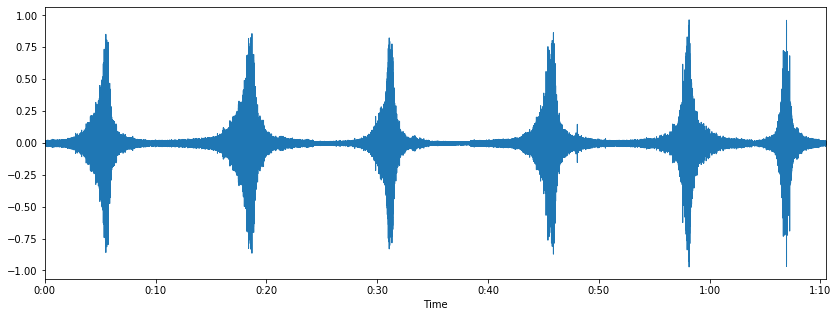

In [124]:
import matplotlib.pyplot as plt
import librosa.display
plt.figure(figsize=(14, 5))
librosa.display.waveplot(x, sr=sr)


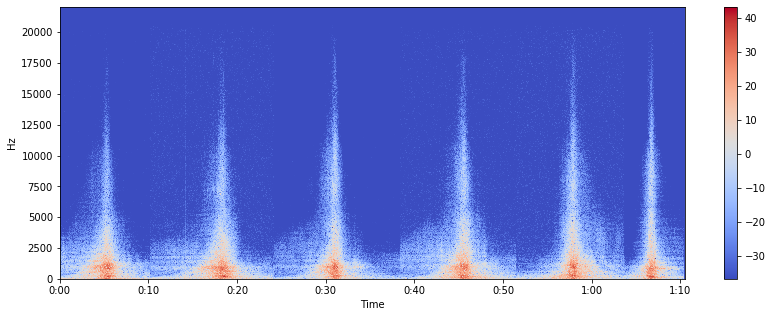

In [127]:
X = librosa.stft(x)
Xdb = librosa.amplitude_to_db(abs(X))
plt.figure(figsize=(14, 5))
librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis='hz')
plt.colorbar()

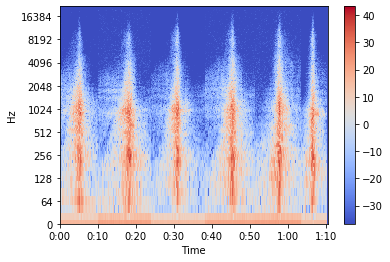

In [128]:
librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis='log')
plt.colorbar()

In [129]:
spectral_centroids = librosa.feature.spectral_centroid(x, sr=sr)[0]
spectral_centroids.shape

(6074,)

In [135]:
# Computing the time variable for visualization
import sklearn# Computing the time variable for visualization
frames = range(len(spectral_centroids))
t = librosa.frames_to_time(frames)
plt.figure(figsize=(12, 4))

<Figure size 864x288 with 0 Axes>

<Figure size 864x288 with 0 Axes>

In [136]:
def normalize(x, axis=0):
    return sklearn.preprocessing.minmax_scale(x, axis=axis)

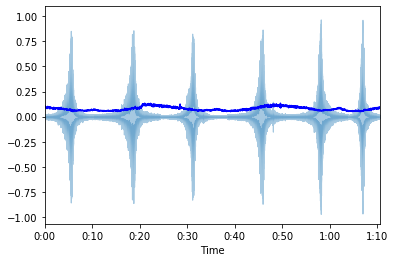

In [137]:
#Plotting the Spectral Centroid along the waveform
librosa.display.waveplot(x, sr=sr, alpha=0.4)
plt.plot(t, normalize(spectral_centroids), color='b')

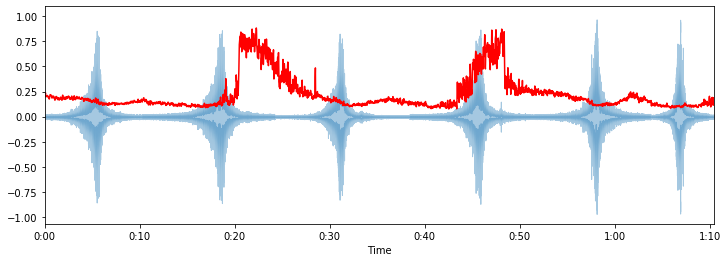

In [139]:
spectral_rolloff = librosa.feature.spectral_rolloff(x+0.01, sr=sr)[0]
plt.figure(figsize=(12, 4))
librosa.display.waveplot(x, sr=sr, alpha=0.4)
plt.plot(t, normalize(spectral_rolloff), color='r')

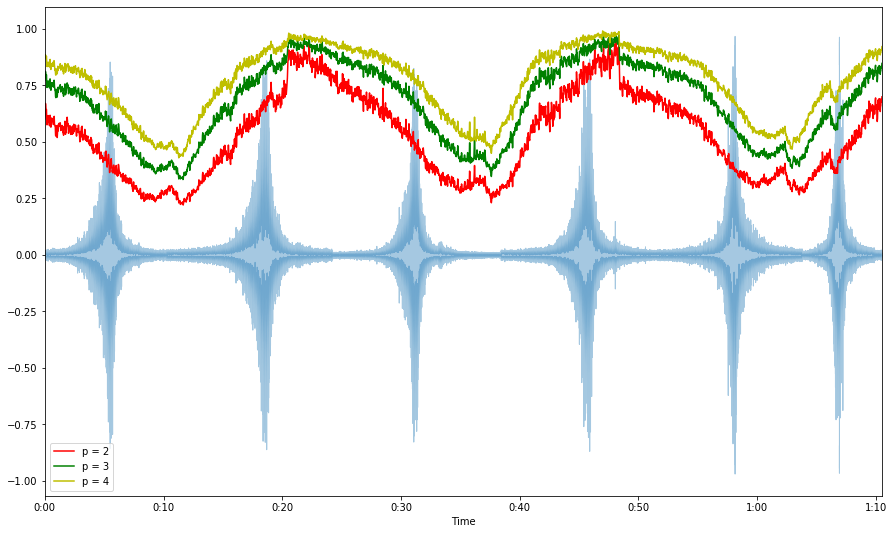

In [141]:
spectral_bandwidth_2 = librosa.feature.spectral_bandwidth(x+0.01, sr=sr)[0]
spectral_bandwidth_3 = librosa.feature.spectral_bandwidth(x+0.01, sr=sr, p=3)[0]
spectral_bandwidth_4 = librosa.feature.spectral_bandwidth(x+0.01, sr=sr, p=4)[0]
plt.figure(figsize=(15, 9))
librosa.display.waveplot(x, sr=sr, alpha=0.4)
plt.plot(t, normalize(spectral_bandwidth_2), color='r')
plt.plot(t, normalize(spectral_bandwidth_3), color='g')
plt.plot(t, normalize(spectral_bandwidth_4), color='y')
plt.legend(('p = 2', 'p = 3', 'p = 4'))

In [4]:
import librosa
y, sr = librosa.load('0556.wav', sr=48000) # y is a numpy array of the wav file, sr = sample rate
y_shifted = librosa.effects.pitch_shift(y, sr, n_steps=4) # shifted by 4 half steps

In [5]:
from scipy.io.wavfile import write
write("test.wav", sr, y_shifted)